In [29]:
import pandas as pd
import matplotlib.pyplot as plt
import pickle
import numpy as np
from sklearn.preprocessing import StandardScaler, MinMaxScaler, QuantileTransformer
from sklearn.ensemble import HistGradientBoostingRegressor as hgbr
from sklearn.multioutput import MultiOutputRegressor
from sklearn.metrics import r2_score as r2 
import shap

In [20]:
# Open the pickle file
df = pickle.load(open('../../data/processed/merged_data_202507062100.pkl', 'rb'))
df

,AAL_Article Count,AAL_Article Count_cum04,AAL_Article Count_cum08,AAL_Article Count_cum16,AAL_Article Count_cum48,AAL_Article Count_cum96,AAL_Change_Article Count,AAL_Change_Article Count_cum04,AAL_Change_Article Count_cum08,AAL_Change_Article Count_cum16,...,month_of_year_11,month_of_year_12,month_of_year_2,month_of_year_3,month_of_year_4,month_of_year_5,month_of_year_6,month_of_year_7,month_of_year_8,month_of_year_9
2018-01-03 09:45:00,8,12,17,32,68,146,6,8,7,7,...,0,0,0,0,0,0,0,0,0,0
2018-01-03 10:00:00,0,11,14,31,68,145,-8,-1,-3,-1,...,0,0,0,0,0,0,0,0,0,0
2018-01-03 10:15:00,0,10,14,29,65,145,0,-1,0,-2,...,0,0,0,0,0,0,0,0,0,0
2018-01-03 10:30:00,3,11,15,32,65,148,3,1,1,3,...,0,0,0,0,0,0,0,0,0,0
2018-01-03 10:45:00,2,5,17,32,63,150,-1,-6,2,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-05-30 14:45:00,0,5,15,29,59,124,-1,-3,-5,-2,...,0,0,0,0,0,1,0,0,0,0
2025-05-30 15:00:00,3,4,16,30,61,125,3,-1,1,1,...,0,0,0,0,0,1,0,0,0,0
2025-05-30 15:15:00,1,5,16,30,61,125,-2,1,0,0,...,0,0,0,0,0,1,0,0,0,0
2025-05-30 15:30:00,1,5,13,30,61,124,0,0,-3,0,...,0,0,0,0,0,1,0,0,0,0


In [21]:
df.columns.tolist()

['AAL_Article Count',
 'AAL_Article Count_cum04',
 'AAL_Article Count_cum08',
 'AAL_Article Count_cum16',
 'AAL_Article Count_cum48',
 'AAL_Article Count_cum96',
 'AAL_Change_Article Count',
 'AAL_Change_Article Count_cum04',
 'AAL_Change_Article Count_cum08',
 'AAL_Change_Article Count_cum16',
 'AAL_Change_Article Count_cum16_lag01',
 'AAL_Change_Article Count_cum16_lag02',
 'AAL_Change_Article Count_cum16_lag03',
 'AAL_Change_Article Count_cum16_lag04',
 'AAL_Change_Article Count_cum16_lag05',
 'AAL_Change_Article Count_cum16_lag06',
 'AAL_Change_Article Count_cum16_lag07',
 'AAL_Change_Article Count_cum16_lag08',
 'AAL_Change_Article Count_cum16_lag09',
 'AAL_Change_Article Count_cum16_lag10',
 'AAL_Change_Article Count_cum16_lag11',
 'AAL_Change_Article Count_cum16_lag12',
 'AAL_Change_Article Count_cum16_lag13',
 'AAL_Change_Article Count_cum16_lag14',
 'AAL_Change_Article Count_cum16_lag15',
 'AAL_Change_Article Count_cum16_lag16',
 'AAL_Change_Article Count_cum16_lag17',
 'AAL_C

In [170]:
[i for i in df.columns if 'lag' in i and 'PCA' in i]

['AAL_Change_PCA_GKG1_0_cum16_lag01',
 'AAL_Change_PCA_GKG1_0_cum16_lag02',
 'AAL_Change_PCA_GKG1_0_cum16_lag03',
 'AAL_Change_PCA_GKG1_0_cum16_lag04',
 'AAL_Change_PCA_GKG1_0_cum16_lag05',
 'AAL_Change_PCA_GKG1_0_cum16_lag06',
 'AAL_Change_PCA_GKG1_0_cum16_lag07',
 'AAL_Change_PCA_GKG1_0_cum16_lag08',
 'AAL_Change_PCA_GKG1_0_cum16_lag09',
 'AAL_Change_PCA_GKG1_0_cum16_lag10',
 'AAL_Change_PCA_GKG1_0_cum16_lag11',
 'AAL_Change_PCA_GKG1_0_cum16_lag12',
 'AAL_Change_PCA_GKG1_0_cum16_lag13',
 'AAL_Change_PCA_GKG1_0_cum16_lag14',
 'AAL_Change_PCA_GKG1_0_cum16_lag15',
 'AAL_Change_PCA_GKG1_0_cum16_lag16',
 'AAL_Change_PCA_GKG1_0_cum16_lag17',
 'AAL_Change_PCA_GKG1_0_cum16_lag18',
 'AAL_Change_PCA_GKG1_0_cum16_lag19',
 'AAL_Change_PCA_GKG1_0_cum16_lag20',
 'AAL_Change_PCA_GKG1_0_cum16_lag21',
 'AAL_Change_PCA_GKG1_0_cum16_lag22',
 'AAL_Change_PCA_GKG1_0_cum16_lag23',
 'AAL_Change_PCA_GKG1_0_cum16_lag24',
 'AAL_Change_PCA_GKG1_0_cum16_lag25',
 'AAL_Change_PCA_GKG1_0_cum16_lag26',
 'AAL_Change

In [83]:
[i for i in df.columns if '_Change_Volume_Day_lag' in i]

,AAL_Change_Volume_Day_lag01,AAL_Change_Volume_Day_lag02,AAL_Change_Volume_Day_lag03,AAL_Change_Volume_Day_lag04,AAL_Change_Volume_Day_lag05,AAL_Change_Volume_Day_lag06,AAL_Change_Volume_Day_lag07,AAL_Change_Volume_Day_lag08,AAL_Change_Volume_Day_lag09,AAL_Change_Volume_Day_lag10,...,UAL_Change_Volume_Day_lag01,UAL_Change_Volume_Day_lag02,UAL_Change_Volume_Day_lag03,UAL_Change_Volume_Day_lag04,UAL_Change_Volume_Day_lag05,UAL_Change_Volume_Day_lag06,UAL_Change_Volume_Day_lag07,UAL_Change_Volume_Day_lag08,UAL_Change_Volume_Day_lag09,UAL_Change_Volume_Day_lag10
2018-01-03 09:45:00,2884,17954,105964,108586,63426,14446,-73601,-23048,63603,-15442,...,244820,191321,219580,312350,287535,299963,225541,146548,230596,301986
2018-01-03 10:00:00,27505,93420,72141,66486,46083,-4797,-258330,-63462,8349,43342,...,110248,6607,79849,64289,69155,67909,-92176,18799,37931,24483
2018-01-03 10:15:00,-39880,17092,-146586,-29434,-33351,12315,-134294,-143422,-21704,-55253,...,7841,-21643,56438,-99348,38262,42699,6925,9226,34127,40484
2018-01-03 10:30:00,761221,813143,814060,802754,794863,753329,590218,749440,809810,767830,...,37280,48504,19352,19817,-33885,61334,10485,-46502,24771,61497
2018-01-03 10:45:00,10816,152883,158350,147349,89770,142145,-24405,80527,130632,131060,...,52507,119047,121208,75510,-28374,89753,69966,-42770,58850,-17934
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-05-30 14:45:00,-247144,-522270,424509,117911,765279,-1243754,672262,774060,-747025,335648,...,-131712,99162,92798,115089,59342,47557,36659,91758,54976,18796
2025-05-30 15:00:00,305522,-1984189,882085,998256,652677,-1256337,-197656,1123306,-527472,-514285,...,82826,103677,115002,104376,-5382,30418,7845,78335,59086,36992
2025-05-30 15:15:00,-212633,-828810,-287517,-5949,-686025,-2679215,-418578,78067,-1028556,-691075,...,294863,333011,339376,227787,265540,171303,270021,312703,296002,272647
2025-05-30 15:30:00,-819890,-937867,-357837,269572,-1290846,-1437964,-680137,539368,-649835,-649757,...,115224,142711,101506,116261,16731,9217,-140886,148766,86342,-33523


In [171]:
# Data preprocessing
tickers     = ['AAL','ALGT','ALK','DAL','JBLU','LUV','UAL']
tickers_all = ['AAL','ALGT','ALK','DAL','JBLU','LUV','UAL','BNO','IYT','ITA','JETS']

y_cols = [f'{i}_Change_Volume' for i in tickers]

#x_cols = [
#        'day_of_week_0','day_of_week_1','day_of_week_2','day_of_week_3','day_of_week_4','month_of_year_1','month_of_year_2','month_of_year_3','month_of_year_4',#'month_of_year_5','month_of_year_6','month_of_year_7','month_of_year_8','month_of_year_9','month_of_year_10','month_of_year_11','month_of_year_12','hour_of_day_9',#'hour_of_day_10','hour_of_day_11','hour_of_day_12','hour_of_day_13','hour_of_day_14','hour_of_day_15',
#        'is_open','is_close'
#        ]

#x_cols = [i for i in df.columns if '_Change_Volume_lag' in i] + [
#          i for i in df.columns if '_Change_Volume_Day_lag' in i] + [
#        'day_of_week_0','day_of_week_1','day_of_week_2','day_of_week_3','day_of_week_4','month_of_year_1','month_of_year_2','month_of_year_3','month_of_year_4',#'month_of_year_5','month_of_year_6','month_of_year_7','month_of_year_8','month_of_year_9','month_of_year_10','month_of_year_11','month_of_year_12',#'hour_of_day_9','hour_of_day_10','hour_of_day_11','hour_of_day_12','hour_of_day_13','hour_of_day_14','hour_of_day_15',
#        'is_open','is_close'
#        ] + [
#            'AAL_Change_Tone_cum16_lag01','ALGT_Change_Tone_cum16_lag01','ALK_Change_Tone_cum16_lag01','DAL_Change_Tone_cum16_lag01','JBLU_Change_Tone_cum16_lag01',#'LUV_Change_Tone_cum16_lag01','UAL_Change_Tone_cum16_lag01','general_Change_Tone_cum16_lag01'
#            ]

y = df[y_cols]
#x = df[x_cols]
#x = df.copy()
#x.drop(columns=['ticker','Time','Last','Volume','Change_Last','Change_Volume','Log_Volume','Log_Price'], inplace=True)
x = df[[i for i in df.columns if 'lag' in i and 'PCA' in i]]

In [172]:
# Train/test splitting
split_val  = round(0.7 * len(x))
split_test = round(0.9 * len(x))

x_train = x[:split_val]
x_val   = x[split_val:split_test]
x_test  = x[split_test:]

y_train = y[:split_val]
y_val   = y[split_val:split_test]
y_test  = y[split_test:]

In [173]:
# Normalize the features to [0,1]
sc2 = MinMaxScaler(feature_range=(0, 1))

x_train = sc2.fit_transform(x_train)
x_val   = sc2.transform(x_val)
x_test  = sc2.transform(x_test)

In [174]:
x_train.shape

(33778, 6240)

In [177]:
model = hgbr(
    learning_rate=0.5,
    min_samples_leaf=1000,
    l2_regularization=0.5,
    max_features=0.1,
    #max_features=1.0,
    max_leaf_nodes=None,
    max_depth=None,
    early_stopping=True,
    scoring='r2',
    n_iter_no_change=20,
    verbose=2,
    max_iter = 100,
    random_state=42
)

multi_model = MultiOutputRegressor(model, n_jobs=1)

multi_model.fit(x_train, y_train)

Binning 1.518 GB of training data: 7.419 s
Binning 0.169 GB of validation data: 0.236 s
Fitting gradient boosted rounds:
[1/100] 1 tree, 25 leaves, max depth = 21, train score: 0.05595, val score: 0.05451, in 0.336s
[2/100] 1 tree, 25 leaves, max depth = 18, train score: 0.08132, val score: 0.07557, in 0.306s
[3/100] 1 tree, 25 leaves, max depth = 16, train score: 0.09478, val score: 0.08446, in 0.357s
[4/100] 1 tree, 25 leaves, max depth = 15, train score: 0.10494, val score: 0.09172, in 0.307s
[5/100] 1 tree, 24 leaves, max depth = 19, train score: 0.11208, val score: 0.09568, in 0.328s
[6/100] 1 tree, 23 leaves, max depth = 16, train score: 0.11725, val score: 0.09679, in 0.309s
[7/100] 1 tree, 25 leaves, max depth = 14, train score: 0.12453, val score: 0.10082, in 0.323s
[8/100] 1 tree, 24 leaves, max depth = 17, train score: 0.12960, val score: 0.10348, in 0.295s
[9/100] 1 tree, 24 leaves, max depth = 16, train score: 0.13531, val score: 0.10526, in 0.297s
[10/100] 1 tree, 25 leav

,estimator,"HistGradientB...2', verbose=2)"
,n_jobs,1
,loss,'squared_error'
,quantile,None
,learning_rate,0.5
,max_iter,100
,max_leaf_nodes,None
,max_depth,None
,min_samples_leaf,1000
,l2_regularization,0.5
,max_features,0.1


In [178]:
multi_model.score(x_val, y_val)

0.19921411749353773

In [179]:
multi_model.score(x_test, y_test)

0.20354599950129146

In [180]:
for model in enumerate(multi_model.estimators_):
    print(f'Model {model[0]} score: {model[1].score(x_val, y_val.iloc[:, model[0]])} on validation set, {model[1].score(x_test, y_test.iloc[:, model[0]])} on test set.')

Model 0 score: 0.12292410498724737 on validation set, 0.06574554516965547 on test set.
Model 1 score: 0.28906010594742404 on validation set, 0.27905065860097356 on test set.
Model 2 score: 0.3161538187889724 on validation set, 0.363794744524331 on test set.
Model 3 score: 0.12840176759941535 on validation set, 0.14131343532421992 on test set.
Model 4 score: 0.13740196009418848 on validation set, 0.17622440671891737 on test set.
Model 5 score: 0.25601543116152603 on validation set, 0.278578266001578 on test set.
Model 6 score: 0.1445416338759904 on validation set, 0.12011494016936508 on test set.


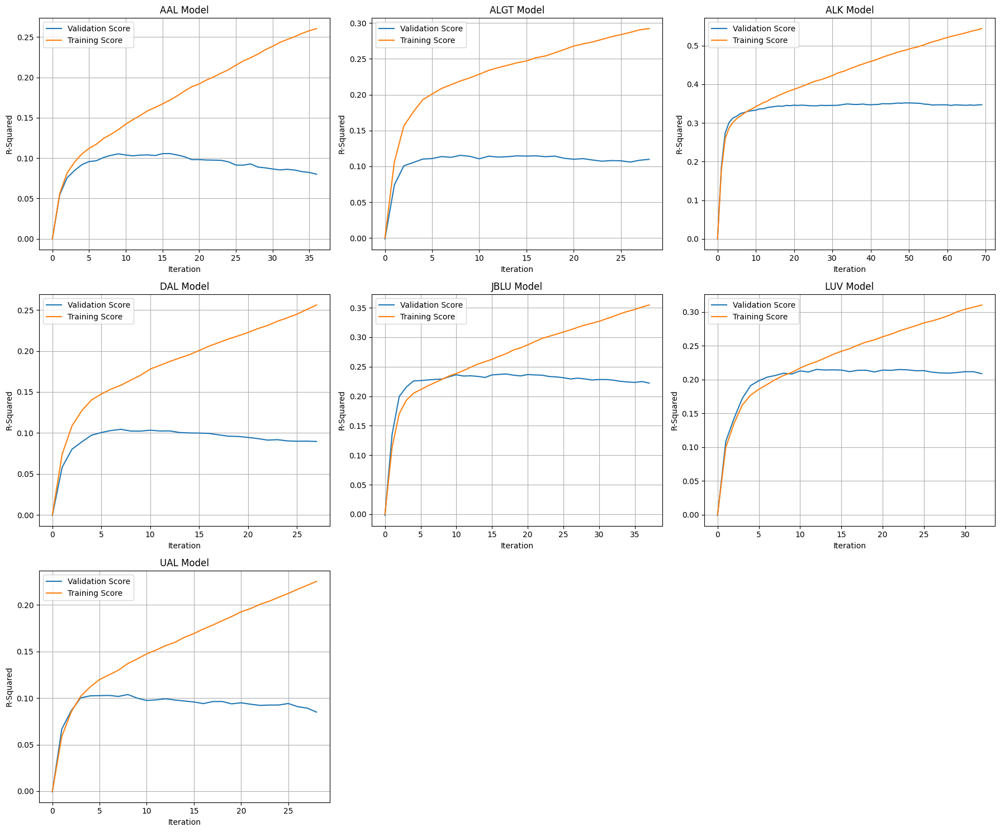

In [181]:
# Graph the training and validation loss for all estimators
fig, axs = plt.subplots(nrows=3, ncols=3, figsize=(18, 15))
axs = axs.flatten()

# Loop through all estimators
for i, estimator in enumerate(multi_model.estimators_):
    if i < len(axs):  # Ensure we don't exceed the number of subplots
        ax = axs[i]
        ax.plot(estimator.validation_score_, label='Validation Score')
        ax.plot(estimator.train_score_, label='Training Score')
        ax.set_title(f'{tickers[i]} Model')
        ax.grid(True)
        ax.set_xlabel('Iteration')
        ax.set_ylabel('R-Squared')
        ax.legend()

# Hide any unused subplots
for j in range(i+1, len(axs)):
    axs[j].set_visible(False)

plt.tight_layout()
plt.show()

In [191]:
# random sample of x_val
x_sample = x_val[np.random.choice(x_val.shape[0], 5000, replace=False)]

explainer = shap.TreeExplainer(multi_model.estimators_[2], x_sample, feature_names=x.columns)
shap_values = explainer(x_sample, check_additivity=False)

 97%|=================== | 4836/5000 [00:22<00:00]       

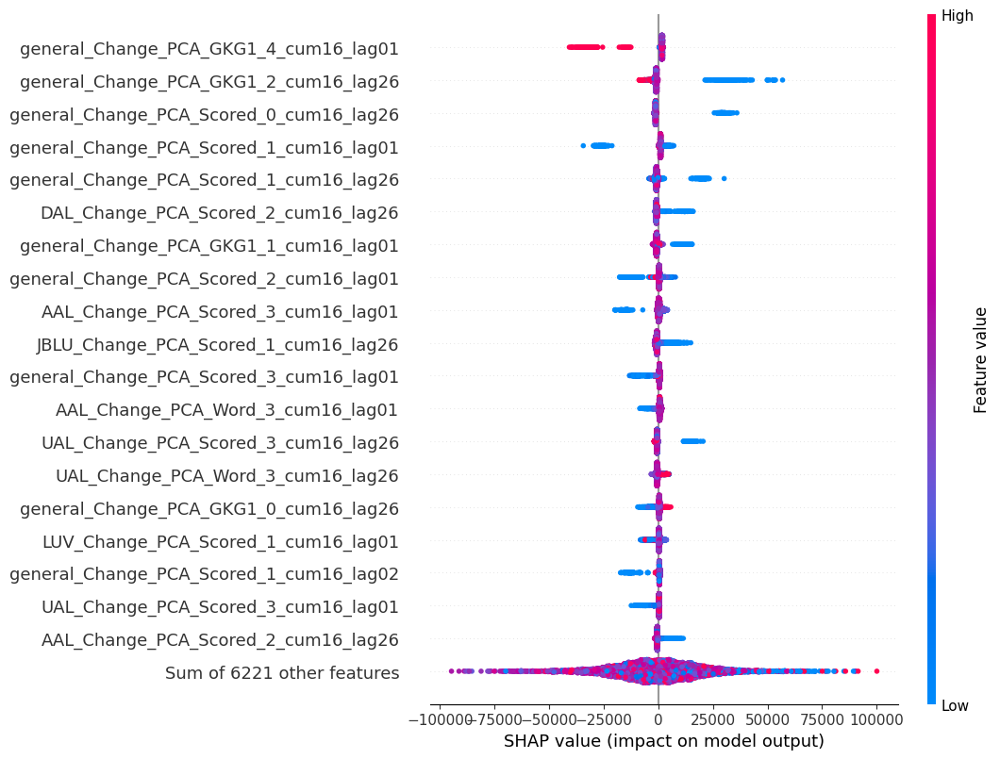

In [192]:
shap.plots.beeswarm(shap_values, max_display=20)

In [134]:
y_pred = multi_model.estimators_[0].predict(x_val)
plot_data = y_val.iloc[:, 0].to_frame()
plot_data['Time'] = plot_data.index
plot_data.reset_index(drop=True, inplace=True)

In [136]:
plot_data = pd.merge(plot_data, pd.DataFrame(y_pred, columns=['y_pred']), left_index=True, right_index=True)

In [137]:
plot_data

,AAL_Change_Volume,Time,y_pred
0,-456970,2023-03-09 10:15:00,-180478.916284
1,266464,2023-03-09 10:30:00,32753.952781
2,-81460,2023-03-09 10:45:00,-254267.080244
3,-169470,2023-03-09 11:00:00,-114227.621499
4,217206,2023-03-09 11:15:00,121999.112671
...,...,...,...
9646,20644,2024-08-30 12:00:00,-50049.043933
9647,-135665,2024-08-30 12:15:00,-152325.989239
9648,-67197,2024-08-30 12:30:00,-116320.381572
9649,203152,2024-08-30 12:45:00,97358.584971


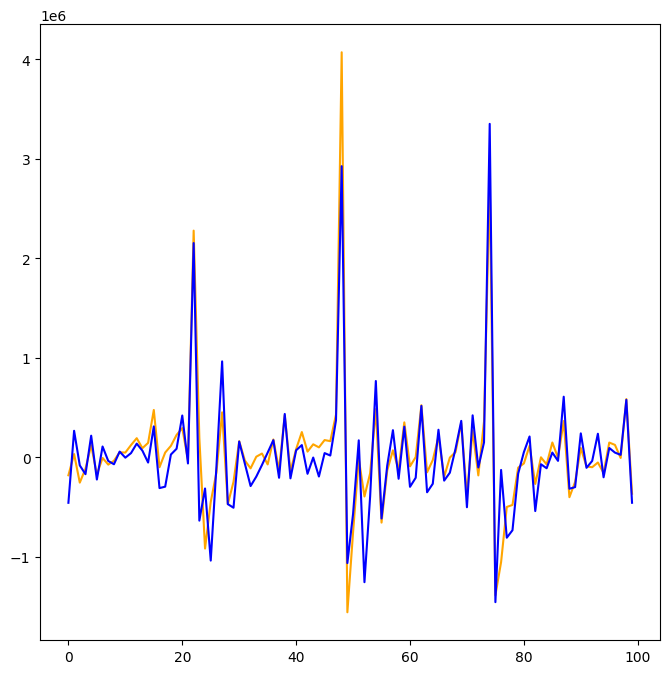

In [145]:
filter_data = plot_data.iloc[:100,:]

plt.figure(figsize=(8, 8))
plt.plot(filter_data.index, filter_data['y_pred'], label='Predicted', color='orange')
plt.plot(filter_data.index, filter_data['AAL_Change_Volume'], label='True', color='blue')